---
title: "Donor Segmentation Using an Ensemble of Clustering Algorithms - Hyperparameter Tuning"
author: "Daniel Smith"
date: "2024-04-02"
categories: [Python, ML, Pandas, scikit-learn, folium, KMeans, GMM, BIRCH, PCA, Clustering, Donor Segmentation, Emmanuel House]
title-block-banner: false
jupyter: python3
image: 'preview.png'
draft: false
description: "Read a Jupyter notebook from my machine learning project for Emmanuel House Support Centre - 'Donor segmentation using an ensemble of clustering algorithms'."
---

 An artificial dataset of charity donors spanning 3 years is preprocessed for clustering. Preprocessing steps includes feature selection by correlation analysis and dimensionality reduction using PCA. A random search is used to tune the hyperparameters of KMeans, GMM and BIRCH models for k=4 and k=5 clusters. The models are combined into an ensemble with hard voting to cluster donors into groups with similar donation patterns. The results of each clustering experiment are geographically presented through interactive maps and judged through visual inspection and comparing silhouette scores.

In [84]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import folium

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, Birch
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, make_scorer
from sklearn.model_selection import RandomizedSearchCV

from collections import Counter
pd.set_option('display.max_columns', None)
import warnings
warnings.filterwarnings("ignore")

**Table of contents**<a id='toc0_'></a>    
1.1. [FEATURES](#toc1_1_)    
2. [PREPROCESSING](#toc2_)    
2.1. [CORRELATION ANALYSIS](#toc2_1_)    
2.2. [NEW FEATURES AFTER REMOVAL](#toc2_2_)    
2.3. [TRANSFORMING, SCALING, PCA, OUTLIERS](#toc2_3_)    
2.3.1. [Log transforming £ features](#toc2_3_1_)    
2.3.2. [`StandardScaler`](#toc2_3_2_)    
2.3.3. [PCA](#toc2_3_3_)    
2.3.4. [REMOVING OUTLIERS](#toc2_3_4_)    
3. [TUNING](#toc3_)    
3.1. [k = 4](#toc3_1_)    
3.1.1. [TUNING K MEANS](#toc3_1_1_)    
3.1.2. [TUNING GMM](#toc3_1_2_)    
3.1.3. [TUNING BIRCH](#toc3_1_3_)    
3.2. [k = 5](#toc3_2_)    
3.2.1. [TUNING K MEANS](#toc3_2_1_)    
3.2.2. [TUNING GMM](#toc3_2_2_)    
3.2.3. [TUNING BIRCH](#toc3_2_3_)    
4. [CODE TO PRODUCE FOLIUM VISUALISATIONS](#toc4_)    
5. [TUNED ENSEMBLES](#toc5_)    
5.1. [k = 4](#toc5_1_)    
5.1.1. [ENSEMBLE: k=4, UNTUNED](#toc5_1_1_)    
5.1.2. [ENSEMBLE: k=4, KMEANS TUNED](#toc5_1_2_)    
5.1.3. [ENSEMBLE: k=4, KMEANS AND GMM TUNED](#toc5_1_3_)    
5.1.4. [ENSEMBLE: k=4, ALL TUNED](#toc5_1_4_)    
5.2. [k = 5](#toc5_2_)    
5.2.1. [ENSEMBLE: k=5, UNTUNED](#toc5_2_1_)    
5.2.2. [ENSEMBLE: k=5, KMEANS TUNED](#toc5_2_2_)    
5.2.3. [ENSEMBLE: k=5, KMEANS & GMM TUNED](#toc5_2_3_)    
5.2.4. [ENSEMBLE: k=5, ALL TUNED](#toc5_2_4_)    

<!-- vscode-jupyter-toc-config
	numbering=true
	anchor=true
	flat=true
	minLevel=1
	maxLevel=5
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

> - This is a notebook directly from one of my projects, and so this post tells less of a story than the others. I think this notebook is better viewed as an exposition of some voluntary data analysis work, and guidance to anyone hoping to use python for donor segmentation in a similar way.
>
>  - The goal of this project is to segment recorded donors into classes such as 'Loyal Supporter' or 'One-Off Donor' by viewing the problem as one of unsupervised ML and applying clustering algorithms to a dataset of donation history.
>
>  - Importantly, geographic features such as latitude and longitude are not included in the dataset on which clustering is applied. Thus we shouldn't expect to see (and indeed don't see) any geographic pattern in the clusters.
>
>  - The artificial dataset used in this post is far more noisy than the real dataset used for Emmanuel House. Thus cleanly seperated and interpretable clusters are harder to achieve here. 

In [85]:
def drop_column(df, col_name):
    if col_name in df.columns:
        df = df.drop(columns=[col_name])
    return df

In [86]:
df = pd.read_csv('../eh3/data.csv')

In [87]:
df['Transactions_DateOfFirstGift'] = pd.to_datetime(df['Transactions_DateOfFirstGift'])
df['Transactions_DateOfLastGift'] = pd.to_datetime(df['Transactions_DateOfLastGift'])

## 1.1. <a id='toc1_1_'></a>[FEATURES](#toc0_)

In [88]:
unscaled_features = ['Transactions_LifetimeGiftsAmount',
                    'Transactions_LifetimeGiftsNumber',
                    'Transactions_AverageGiftAmount',

                    'Transactions_Months1To12GiftsAmount',
                    'Transactions_Months1To12GiftsNumber',
                    'Transactions_Months13To24GiftsAmount',
                    'Transactions_Months13To24GiftsNumber',
                    'Transactions_Months25To36GiftsAmount',
                    'Transactions_Months25To36GiftsNumber',
                    'Transactions_FirstGiftAmount',
                    'Transactions_LastGiftAmount',
                    'monthsSinceFirstDonation',
                    'monthsSinceLastDonation',
                    'activeMonths',
                    'Transactions_HighestGiftAmount',
                    'Transactions_LowestGiftAmount',
                   ]


scaled_features = ['DonationFrequency',
                   'DonationFrequencyActive',]


binary_features = []


features = unscaled_features + scaled_features + binary_features

In [89]:
len(features)

18

# 2. <a id='toc2_'></a>[PREPROCESSING](#toc0_)

## 2.1. <a id='toc2_1_'></a>[CORRELATION ANALYSIS](#toc0_)

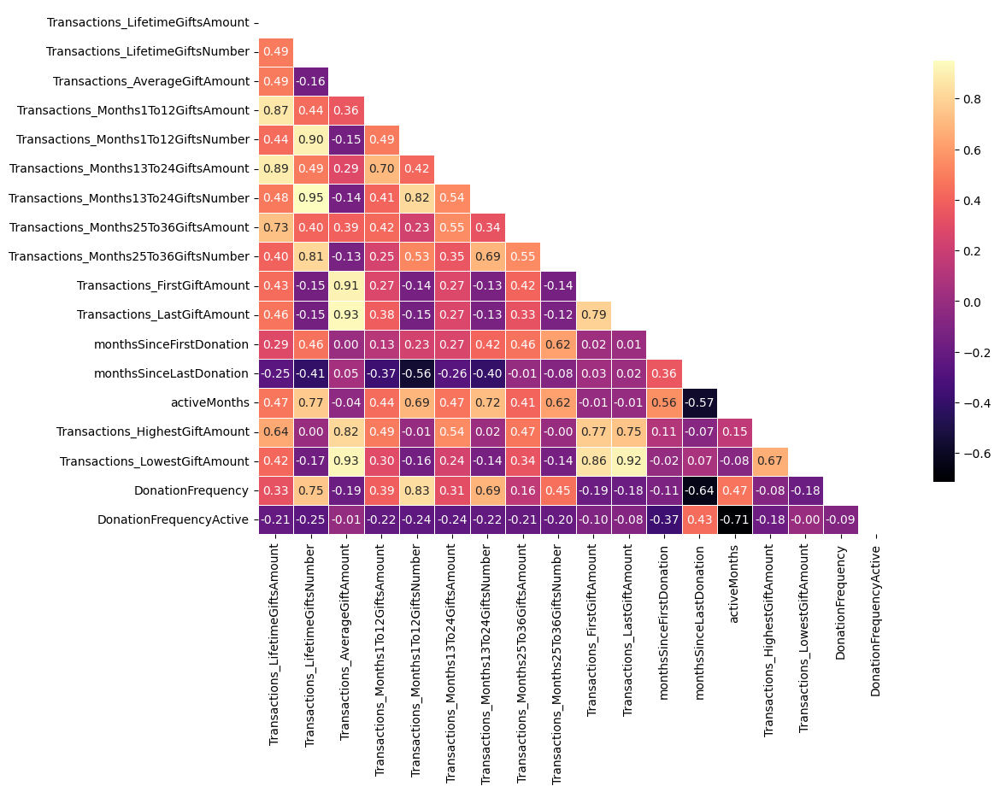

In [90]:
plt.figure(figsize=(12, 8))

# Compute the correlation matrix
corr = df[features].corr(numeric_only=True)

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool), k=0)

# Draw the heatmap with the mask
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap='magma', 
            cbar_kws={"shrink": .8}, linewidths=.5)

# Rotate the y labels (ticks) to horizontal
plt.yticks(rotation=0)
plt.show()


In [91]:
print('15 most highly correlated pairs of features (in absolute value):\n')
print(corr.abs().where(~mask).stack().sort_values(ascending=False).head(15))

15 most highly correlated pairs of features (in absolute value):

Transactions_Months13To24GiftsNumber  Transactions_LifetimeGiftsNumber       0.949797
Transactions_LastGiftAmount           Transactions_AverageGiftAmount         0.934479
Transactions_LowestGiftAmount         Transactions_AverageGiftAmount         0.928709
                                      Transactions_LastGiftAmount            0.915917
Transactions_FirstGiftAmount          Transactions_AverageGiftAmount         0.905685
Transactions_Months1To12GiftsNumber   Transactions_LifetimeGiftsNumber       0.899897
Transactions_Months13To24GiftsAmount  Transactions_LifetimeGiftsAmount       0.890478
Transactions_Months1To12GiftsAmount   Transactions_LifetimeGiftsAmount       0.868661
Transactions_LowestGiftAmount         Transactions_FirstGiftAmount           0.855994
DonationFrequency                     Transactions_Months1To12GiftsNumber    0.834842
Transactions_Months13To24GiftsNumber  Transactions_Months1To12GiftsNumber 

## 2.2. <a id='toc2_2_'></a>[NEW FEATURES AFTER REMOVAL](#toc0_)

In [92]:
unscaled_features = ['Transactions_LifetimeGiftsAmount',
                    'Transactions_LifetimeGiftsNumber',
                    'Transactions_AverageGiftAmount',




                    'Transactions_Months25To36GiftsAmount',
                     
                    'Transactions_FirstGiftAmount',
                    'monthsSinceFirstDonation',
                    'monthsSinceLastDonation',
                    'activeMonths',

                   ]


scaled_features = ['DonationFrequency',
                   'DonationFrequencyActive',]


binary_features = []


features = unscaled_features + scaled_features + binary_features

In [93]:
len(features)

10

## 2.3. <a id='toc2_3_'></a>[TRANSFORMING, SCALING, PCA, OUTLIERS](#toc0_)

### 2.3.1. <a id='toc2_3_1_'></a>[Log transforming £ features](#toc0_)

In [94]:
df_log = df[features].copy()

# Logarithmically scaling down features representing donation totals
# np.log1p is the function x |--> ln(1+x)

df_log['Transactions_Months1To12GiftsAmount'] = np.log1p(df['Transactions_Months1To12GiftsAmount'])
df_log['Transactions_Months13To24GiftsAmount'] = np.log1p(df['Transactions_Months13To24GiftsAmount'])
df_log['Transactions_Months25To36GiftsAmount'] = np.log1p(df['Transactions_Months25To36GiftsAmount'])

df_log['Transactions_FirstGiftAmount'] = np.log1p(df['Transactions_FirstGiftAmount'])
df_log['Transactions_LastGiftAmount'] = np.log1p(df['Transactions_LastGiftAmount'])

df_log['Transactions_HighestGiftAmount'] = np.log1p(df['Transactions_HighestGiftAmount'])
df_log['Transactions_LowestGiftAmount'] = np.log1p(df['Transactions_LowestGiftAmount'])

df_log['Transactions_LifetimeGiftsAmount'] = np.log1p(df['Transactions_LifetimeGiftsAmount'])

df_log['Transactions_AverageGiftAmount'] = np.log1p(df['Transactions_LifetimeGiftsAmount'])/df['Transactions_LifetimeGiftsNumber']

In [95]:
df_log = df_log[features]

In [96]:
df_log.sample(10)

,Transactions_LifetimeGiftsAmount,Transactions_LifetimeGiftsNumber,Transactions_AverageGiftAmount,Transactions_Months25To36GiftsAmount,Transactions_FirstGiftAmount,monthsSinceFirstDonation,monthsSinceLastDonation,activeMonths,DonationFrequency,DonationFrequencyActive
117,5.298117,2,2.649059,0.000000,4.630448,14,14,1,0.133333,2.000000
514,7.484790,34,0.220141,6.229497,3.947583,35,1,35,0.944444,0.971429
388,4.880754,2,2.440377,0.000000,4.223177,15,15,1,0.125000,2.000000
463,3.910622,2,1.955311,3.216072,3.274878,27,27,1,0.071429,2.000000
232,3.067588,4,0.766897,0.000000,1.803359,3,0,4,1.000000,1.000000
311,8.229794,35,0.235137,7.083161,4.639668,36,1,36,0.945946,0.972222
56,5.856990,37,0.158297,4.661078,2.430978,36,1,36,1.000000,1.027778
728,3.703275,2,1.851638,0.000000,3.027231,1,0,2,1.000000,1.000000
364,5.038510,3,1.679503,3.929863,3.911023,27,3,25,0.107143,0.120000
415,4.876418,4,1.219104,3.944297,3.937886,28,3,26,0.137931,0.153846


### 2.3.2. <a id='toc2_3_2_'></a>[`StandardScaler`](#toc0_)

In [97]:
# Scaling non-binary features
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df[unscaled_features]), columns=unscaled_features)
df_concat = pd.concat([df_scaled, df[scaled_features], df[binary_features]], axis=1)

### 2.3.3. <a id='toc2_3_3_'></a>[PCA](#toc0_)

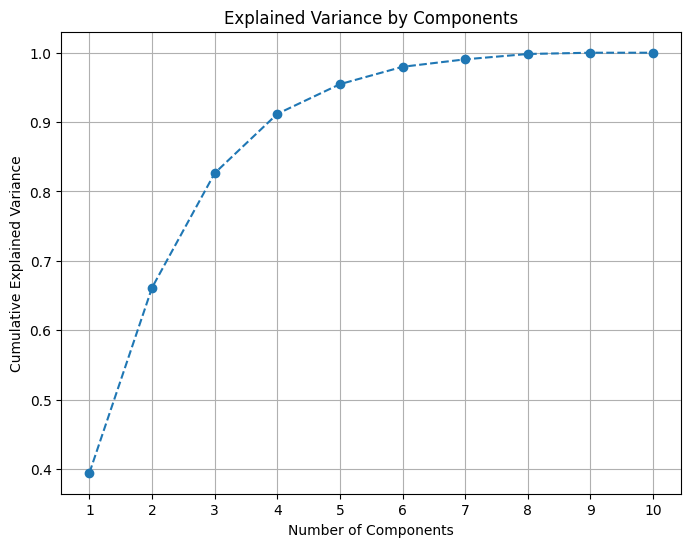

In [98]:
# Choosing n_components by producing an explained variance plot
pca = PCA()
df_pca = pca.fit_transform(df_concat)

# Calculate the cumulative explained variance
explained_variance = np.cumsum(pca.explained_variance_ratio_)

# Plot the elbow graph
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
plt.title('Explained Variance by Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')

# Add gridlines
plt.grid(True)

# Ensure non-fractional x labels
ax = plt.gca()
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

plt.show()

In [99]:
# Apply PCA with chosen number of components
pca = PCA(n_components=7)
df_pca = pd.DataFrame(pca.fit_transform(df_concat))

### 2.3.4. <a id='toc2_3_4_'></a>[REMOVING OUTLIERS](#toc0_)

We declare a donor to be an outlier if they have any of `Transactions_LifetimeGiftsAmount`, `Transactions_AverageGiftAmount` or `Transactions_LifetimeGiftsNumber` at more than 3 standard deviations above the mean.

Outliers are removed before clustering to improve interpretability of results.

In [100]:
# Define thresholds at which to cutoff outliers and remove such rows from the dataframe
amnt_thres = df['Transactions_LifetimeGiftsAmount'].mean() + 3*df['Transactions_LifetimeGiftsAmount'].std()
avg_thres = df['Transactions_AverageGiftAmount'].mean() + 3*df['Transactions_AverageGiftAmount'].std()
num_thres = df['Transactions_LifetimeGiftsNumber'].mean() + 3*df['Transactions_LifetimeGiftsNumber'].std()
mask = ~((df['Transactions_LifetimeGiftsAmount'] > amnt_thres) | (df['Transactions_AverageGiftAmount'] > avg_thres) | (df['Transactions_LifetimeGiftsNumber'] > num_thres))
df_pca_without_outliers = df_pca[mask]

# 3. <a id='toc3_'></a>[TUNING](#toc0_)

## 3.1. <a id='toc3_1_'></a>[k = 4](#toc0_)

### 3.1.1. <a id='toc3_1_1_'></a>[TUNING K MEANS](#toc0_)

In [101]:
k = 4

# Define the parameter grid
param_grid = {
    'init': ['k-means++', 'random'],
    'n_init': list(range(10, 200)), 
    'algorithm': ['auto', 'lloyd', 'elkan'],
    'max_iter': list(range(100, 500)),
    'tol': [1e-4, 1e-3, 1e-2, 1e-1, 1],
}


# Create a KMeans instance with a fixed number of clusters
kmeans = KMeans(n_clusters=k)

# Create a silhouette scorer
silhouette_scorer = make_scorer(silhouette_score)

# Create a RandomizedSearchCV instance
random_search = RandomizedSearchCV(kmeans, 
                                   param_grid, 
                                   n_iter=50,
                                   cv=3, 
                                   random_state=594,
                                   scoring=silhouette_scorer,
                                  )

# Fit the RandomizedSearchCV instance 
random_search.fit(df_pca_without_outliers)

# Get the best parameters
best_params_kmeans_4 = random_search.best_params_

# Print the best parameters
print(f'Best params for KMeans with k={k}:\n')
print(best_params_kmeans_4)

Best params for KMeans with k=4:

{'tol': 0.0001, 'n_init': 129, 'max_iter': 238, 'init': 'k-means++', 'algorithm': 'elkan'}


### 3.1.2. <a id='toc3_1_2_'></a>[TUNING GMM](#toc0_)

In [102]:
k = 4

# Define the parameter grid for GMM
param_grid_gmm = {
    'n_init': list(range(1, 21)), 
    'covariance_type': ['full', 'tied', 'diag', 'spherical'],
    'tol': [1e-3, 1e-4, 1e-5, 1e-6],
    'reg_covar': [1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1],
    'max_iter': list(range(100, 500)) 
}


# Create a GMM instance
gmm = GaussianMixture(n_components=k)

# Create a silhouette scorer
silhouette_scorer = make_scorer(silhouette_score)

# Create a RandomizedSearchCV instance for GMM
random_search_gmm = RandomizedSearchCV(gmm, 
                                       param_grid_gmm, 
                                       n_iter=50, 
                                       cv=3, 
                                       random_state=594,
                                       scoring=silhouette_scorer,
                                      )

# Fit the RandomizedSearchCV instance to your data
random_search_gmm.fit(df_pca_without_outliers)

# Get the best parameters for GMM
best_params_gmm_4 = random_search_gmm.best_params_

# Print the best parameters for GMM
print(f'Best params for GMM with k={k}:\n')
print(best_params_gmm_4)

Best params for GMM with k=4:

{'tol': 1e-06, 'reg_covar': 1, 'n_init': 20, 'max_iter': 376, 'covariance_type': 'diag'}


### 3.1.3. <a id='toc3_1_3_'></a>[TUNING BIRCH](#toc0_)

In [103]:
k = 4

# Define the parameter grid for BIRCH
param_grid_birch = {
    'threshold': [0.1, 0.3, 0.5, 0.7, 0.9],
    'branching_factor': list(range(20, 100))
}

# Create a BIRCH instance
birch = Birch(n_clusters=k)

# Create a silhouette scorer
silhouette_scorer = make_scorer(silhouette_score)

# Create a RandomizedSearchCV instance for BIRCH
random_search_birch = RandomizedSearchCV(birch, 
                                         param_grid_birch, 
                                         n_iter=50, 
                                         cv=3, 
                                         random_state=594,
                                         scoring=silhouette_scorer,
                                        )

# Fit the RandomizedSearchCV instance to your data
random_search_birch.fit(df_pca_without_outliers)

# Get the best parameters for BIRCH
best_params_birch_4 = random_search_birch.best_params_

# Print the best parameters for BIRCH
print(f'Best params for BIRCH with k={k}:\n')
print(best_params_birch_4)

Best params for BIRCH with k=4:

{'threshold': 0.7, 'branching_factor': 51}


## 3.2. <a id='toc3_2_'></a>[k = 5](#toc0_)

### 3.2.1. <a id='toc3_2_1_'></a>[TUNING K MEANS](#toc0_)

In [104]:
k = 5

param_grid = {
    'init': ['k-means++', 'random'],
    'n_init': list(range(10, 200)), 
    'algorithm': ['auto', 'lloyd', 'elkan'],
    'max_iter': list(range(100, 500)),
    'tol': [1e-4, 1e-3, 1e-2, 1e-1, 1],
}


# Create a KMeans instance with n clusters
kmeans = KMeans(n_clusters=k)

# Create a silhouette scorer
silhouette_scorer = make_scorer(silhouette_score)

# Create a RandomizedSearchCV instance
random_search = RandomizedSearchCV(kmeans, 
                                   param_grid, 
                                   n_iter=50,
                                   cv=3, 
                                   random_state=594,
                                   scoring=silhouette_scorer,
                                  )

# Fit the RandomizedSearchCV instance
random_search.fit(df_pca_without_outliers)

# Get the best parameters
best_params_kmeans_5 = random_search.best_params_

# Print the best parameters
print(f'Best params for KMeans with k={k}:\n')
print(best_params_kmeans_5)

Best params for KMeans with k=5:

{'tol': 0.0001, 'n_init': 129, 'max_iter': 238, 'init': 'k-means++', 'algorithm': 'elkan'}


### 3.2.2. <a id='toc3_2_2_'></a>[TUNING GMM](#toc0_)

In [105]:
k = 5

# Define the parameter grid for GMM
param_grid_gmm = {
    'n_init': list(range(1, 21)), 
    'covariance_type': ['full', 'tied', 'diag', 'spherical'],
    'tol': [1e-3, 1e-4, 1e-5, 1e-6],
    'reg_covar': [1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1],
    'max_iter': list(range(100, 500)) 
}

# Create a GMM instance
gmm = GaussianMixture(n_components=k)

# Create a silhouette scorer
silhouette_scorer = make_scorer(silhouette_score)

# Create a RandomizedSearchCV instance for GMM
random_search_gmm = RandomizedSearchCV(gmm, 
                                       param_grid_gmm, 
                                       n_iter=50, 
                                       cv=3, 
                                       random_state=594,
                                       scoring=silhouette_scorer,
                                      )

# Fit the RandomizedSearchCV instance to your data
random_search_gmm.fit(df_pca_without_outliers)

# Get the best parameters for GMM
best_params_gmm_5 = random_search_gmm.best_params_

# Print the best parameters for GMM
print(f'Best params for GMM with k={k}:\n')
print(best_params_gmm_5)

Best params for GMM with k=5:

{'tol': 1e-06, 'reg_covar': 1, 'n_init': 20, 'max_iter': 376, 'covariance_type': 'diag'}


### 3.2.3. <a id='toc3_2_3_'></a>[TUNING BIRCH](#toc0_)

In [106]:
k = 5

# Define the parameter grid for BIRCH
param_grid_birch = {
    'threshold': np.arange(0.05, 1.05, 0.05),
    'branching_factor': list(range(20, 200))
}

# Create a BIRCH instance
birch = Birch(n_clusters=k)

# Create a silhouette scorer
silhouette_scorer = make_scorer(silhouette_score)

# Create a RandomizedSearchCV instance for BIRCH
random_search_birch = RandomizedSearchCV(birch, 
                                         param_grid_birch, 
                                         n_iter=50, 
                                         cv=3, 
                                         random_state=594,
                                         scoring=silhouette_scorer,
                                        )

# Fit the RandomizedSearchCV instance to your data
random_search_birch.fit(df_pca_without_outliers)

# Get the best parameters for BIRCH
best_params_birch_5 = random_search_birch.best_params_

# Print the best parameters for BIRCH
print(f'Best params for KMeans with k={k}:\n')
print(best_params_birch_5)

Best params for KMeans with k=5:

{'threshold': 0.7500000000000001, 'branching_factor': 80}


# 4. <a id='toc4_'></a>[CODE TO PRODUCE FOLIUM VISUALISATIONS](#toc0_)

In [111]:
def make_map(df):
    # Producing an interactive visualisation of results with folium
    
    m = folium.Map(location=[52.9548, -1.1581], zoom_start=12)
    
    colors = ['green', 'blue', 'orange', 'red', 'black']
    
    for index, row in df.iterrows():      
        fname = 'Example'
        lname = 'Donor'
        email = 'exampledonor@email.com'
        
        total_don = row['Transactions_LifetimeGiftsAmount']
        num_don = row['Transactions_LifetimeGiftsNumber']
        avg_don = row['Transactions_AverageGiftAmount']
        
        news = bool(row['Newsletter'])
        monthly = bool(row['monthlyDonorMonths1to12'])
        
        lat = row['Latitude']
        long = row['Longitude']
        
        dateoffirst = row['Transactions_DateOfFirstGift'].strftime('%d/%m/%Y')
        dateoflast = row['Transactions_DateOfLastGift'].strftime('%d/%m/%Y')
    
        active = row['activeMonths']
        freq = row['DonationFrequency']
        freq_active = row['DonationFrequencyActive']
    
        label = row['ClusterLabel']
        dist = row['DistanceFromEHSC']

        # Add popups when a marker clicked on
        popup_text = f'''
                        <div style="width: 200px; font-family: Arial; line-height: 1.2;">
                            <h4 style="margin-bottom: 5px;">{fname} {lname}</h4>
                            <p style="margin: 0;"><b>Total Donated:</b> £{total_don:.2f}</p>
                            <p style="margin: 0;"><b>Number of Donations:</b> {num_don}</p>
                            <p style="margin: 0;"><b>Average Donation:</b> £{avg_don:.2f}</p>
                            <br>\
                            <p style="margin: 0;"><b>First Recorded Donation:</b> {dateoffirst}</p>
                            <p style="margin: 0;"><b>Last Recorded Donation:</b> {dateoflast}</p>
                            <br>\
                            <p style="margin: 0;"><b>ActiveMonths:</b> {active}</p>
                            <p style="margin: 0;"><b>DonationFrequency</b> {freq:.2f}</p>
                            <p style="margin: 0;"><b>DonationFrequencyActive</b> {freq_active:.2f}</p>
                            <br>\
                            <p style="margin: 0;"><b>Subscribed to Newsletter:</b> {"Yes" if news else "No"}</p>
                            <p style="margin: 0;"><b>Current Monthly Donor:</b> {"Yes" if monthly else "No"}</p>
                            <br>\
                            <p style="margin: 0;"><b>Distance from EHSC:</b> {dist:.2f}km</p>
                            <br>\
                            <p style="margin: 0;"><b>Email:</b><br> {email}</p>
                        </div>
                        '''
    
        
        color = colors[label]
        
        marker = folium.CircleMarker(
            location=[lat, long],
            radius=5,
            color=color, 
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=popup_text
        ).add_to(m)

    # Create a marker at EHSC
    ehsc_html = '''<h4 style="margin-bottom: 5px;">Emmanuel House Support Centre</h4>
    <a href="https://www.emmanuelhouse.org.uk/" target="_blank">https://www.emmanuelhouse.org.uk/</a>
    <p>Emmanuel House is an independent charity that supports people who are homeless, rough sleeping, in crisis, or at risk of homelessness in Nottingham.</p>
    '''
    ehsc_coords = (52.95383, -1.14168)
    marker = folium.Marker(location=ehsc_coords, popup=folium.Popup(ehsc_html))
    m.add_child(marker)
        
    return m
        

# 5. <a id='toc5_'></a>[TUNED ENSEMBLES](#toc0_)

## 5.1. <a id='toc5_1_'></a>[k = 4](#toc0_)

### 5.1.1. <a id='toc5_1_1_'></a>[ENSEMBLE: k=4, UNTUNED](#toc0_)

In [108]:
k = 4

# Drop 'ClusterLabel' if present from a previous run
# (Otherwise the 'ClusterLabel' feature would be used in the clustering)
df = drop_column(df, 'ClusterLabel')
df_pca_without_outliers = drop_column(df_pca_without_outliers, 'ClusterLabel')


# Create the clustering models
models = [
    KMeans(n_clusters=k, 
           random_state=594),

    
    GaussianMixture(n_components=k, 
                    random_state=594),

    
    Birch(n_clusters=k),
]

# Fit the models and predict the labels
labels = []
for model in models:
    model.fit(df_pca_without_outliers)
    if isinstance(model, GaussianMixture):
        label = model.predict(df_pca_without_outliers)  # For GMM, use predict to get hard labels
    else:
        label = model.labels_
    labels.append(label)

# Combine the labels using a majority voting scheme
labels_ensemble = []
for i in range(len(df_pca_without_outliers)):
    # Get the labels for the i-th data point from all models
    labels_i = [labels_j[i] for labels_j in labels]
    # Get the most common label
    most_common_label = Counter(labels_i).most_common(1)[0][0]
    labels_ensemble.append(most_common_label)

# Get and print avg silhouette score
silhouette_avg = silhouette_score(df_pca_without_outliers, labels_ensemble)
print("Average silhouette score of clustering:", silhouette_avg)

Average silhouette score of clustering: 0.3239061338727754


In [109]:
# Assign the ensemble labels to the dataframe
df_pca_without_outliers['ClusterLabel'] = labels_ensemble
df_pca_without_outliers['ClusterLabel'].value_counts()

ClusterLabel
3    230
0    227
1    202
2     59
Name: count, dtype: int64

In [112]:
# Producing interactive visualisation of clustering results with folium
geo = df.merge(df_pca_without_outliers[['ClusterLabel']], left_index=True, right_index=True, how='left')
geo = geo.dropna()
geo['ClusterLabel'] = geo['ClusterLabel'].astype(int)
make_map(geo)

### 5.1.2. <a id='toc5_1_2_'></a>[ENSEMBLE: k=4, KMEANS TUNED](#toc0_)

In [113]:
k = 4

# Drop 'ClusterLabel' if present from a previous run
# (Otherwise the 'ClusterLabel' feature would be used in the clustering)
df = drop_column(df, 'ClusterLabel')
df_pca_without_outliers = drop_column(df_pca_without_outliers, 'ClusterLabel')


# Create the clustering models
models = [
    KMeans(n_clusters=k, 
           random_state=594,
          **best_params_kmeans_4),

    
    GaussianMixture(n_components=k, 
                    random_state=594),

    
    Birch(n_clusters=k),
]

# Fit the models and predict the labels
labels = []
for model in models:
    model.fit(df_pca_without_outliers)
    if isinstance(model, GaussianMixture):
        label = model.predict(df_pca_without_outliers)  # For GMM, use predict to get hard labels
    else:
        label = model.labels_
    labels.append(label)

# Combine the labels using a majority voting scheme
labels_ensemble = []
for i in range(len(df_pca_without_outliers)):
    # Get the labels for the i-th data point from all models
    labels_i = [labels_j[i] for labels_j in labels]
    # Get the most common label
    most_common_label = Counter(labels_i).most_common(1)[0][0]
    labels_ensemble.append(most_common_label)

# Get and print avg silhouette score
silhouette_avg = silhouette_score(df_pca_without_outliers, labels_ensemble)
print("Average silhouette score of clustering:", silhouette_avg)

Average silhouette score of clustering: 0.2949886894806671


In [114]:
# Assign the ensemble labels to the dataframe
df_pca_without_outliers['ClusterLabel'] = labels_ensemble
df_pca_without_outliers['ClusterLabel'].value_counts()

ClusterLabel
2    231
3    196
1    184
0    107
Name: count, dtype: int64

In [115]:
# Producing interactive visualisation of clustering results with folium
geo = df.merge(df_pca_without_outliers[['ClusterLabel']], left_index=True, right_index=True, how='left')
geo = geo.dropna()
geo['ClusterLabel'] = geo['ClusterLabel'].astype(int)
make_map(geo)

### 5.1.3. <a id='toc5_1_3_'></a>[ENSEMBLE: k=4, KMEANS AND GMM TUNED](#toc0_)

In [116]:
k = 4

# Drop 'ClusterLabel' if present from a previous run
# (Otherwise the 'ClusterLabel' feature would be used in the clustering)
df = drop_column(df, 'ClusterLabel')
df_pca_without_outliers = drop_column(df_pca_without_outliers, 'ClusterLabel')


# Create the clustering models
models = [
    KMeans(n_clusters=k, 
           random_state=594,
          **best_params_kmeans_4),

    
    GaussianMixture(n_components=k, 
                    random_state=594,
                **best_params_gmm_4),

    
    Birch(n_clusters=k),
]

# Fit the models and predict the labels
labels = []
for model in models:
    model.fit(df_pca_without_outliers)
    if isinstance(model, GaussianMixture):
        label = model.predict(df_pca_without_outliers)  # For GMM, use predict to get hard labels
    else:
        label = model.labels_
    labels.append(label)

# Combine the labels using a majority voting scheme
labels_ensemble = []
for i in range(len(df_pca_without_outliers)):
    # Get the labels for the i-th data point from all models
    labels_i = [labels_j[i] for labels_j in labels]
    # Get the most common label
    most_common_label = Counter(labels_i).most_common(1)[0][0]
    labels_ensemble.append(most_common_label)

# Get and print avg silhouette score
silhouette_avg = silhouette_score(df_pca_without_outliers, labels_ensemble)
print("Average silhouette score of clustering:", silhouette_avg)

Average silhouette score of clustering: 0.159535044802508


In [117]:
# Assign the ensemble labels to the dataframe
df_pca_without_outliers['ClusterLabel'] = labels_ensemble
df_pca_without_outliers['ClusterLabel'].value_counts()

ClusterLabel
2    327
0    219
1    155
3     17
Name: count, dtype: int64

In [118]:
# Producing interactive visualisation of clustering results with folium
geo = df.merge(df_pca_without_outliers[['ClusterLabel']], left_index=True, right_index=True, how='left')
geo = geo.dropna()
geo['ClusterLabel'] = geo['ClusterLabel'].astype(int)
make_map(geo)

### 5.1.4. <a id='toc5_1_4_'></a>[ENSEMBLE: k=4, ALL TUNED](#toc0_)

In [119]:
k = 4

# Drop 'ClusterLabel' if present from a previous run
# (Otherwise the 'ClusterLabel' feature would be used in the clustering)
df = drop_column(df, 'ClusterLabel')
df_pca_without_outliers = drop_column(df_pca_without_outliers, 'ClusterLabel')


# Create the clustering models
models = [
    KMeans(n_clusters=k, 
           random_state=594,
          **best_params_kmeans_4),

    
    GaussianMixture(n_components=k, 
                    random_state=594,
                **best_params_gmm_4),

    
    Birch(n_clusters=k,
          **best_params_birch_4),
]

# Fit the models and predict the labels
labels = []
for model in models:
    model.fit(df_pca_without_outliers)
    if isinstance(model, GaussianMixture):
        label = model.predict(df_pca_without_outliers)  # For GMM, use predict to get hard labels
    else:
        label = model.labels_
    labels.append(label)

# Combine the labels using a majority voting scheme
labels_ensemble = []
for i in range(len(df_pca_without_outliers)):
    # Get the labels for the i-th data point from all models
    labels_i = [labels_j[i] for labels_j in labels]
    # Get the most common label
    most_common_label = Counter(labels_i).most_common(1)[0][0]
    labels_ensemble.append(most_common_label)

# Get and print avg silhouette score
silhouette_avg = silhouette_score(df_pca_without_outliers, labels_ensemble)
print("Average silhouette score of clustering:", silhouette_avg)

Average silhouette score of clustering: 0.21204320844898647


In [120]:
# Assign the ensemble labels to the dataframe
df_pca_without_outliers['ClusterLabel'] = labels_ensemble
df_pca_without_outliers['ClusterLabel'].value_counts()

ClusterLabel
2    327
1    188
0    185
3     18
Name: count, dtype: int64

In [121]:
# Producing interactive visualisation of clustering results with folium
geo = df.merge(df_pca_without_outliers[['ClusterLabel']], left_index=True, right_index=True, how='left')
geo = geo.dropna()
geo['ClusterLabel'] = geo['ClusterLabel'].astype(int)
make_map(geo)

## 5.2. <a id='toc5_2_'></a>[k = 5](#toc0_)

### 5.2.1. <a id='toc5_2_1_'></a>[ENSEMBLE: k=5, UNTUNED](#toc0_)

In [122]:
k = 5

# Drop 'ClusterLabel' if present from a previous run
# (Otherwise the 'ClusterLabel' feature would be used in the clustering)
df = drop_column(df, 'ClusterLabel')
df_pca_without_outliers = drop_column(df_pca_without_outliers, 'ClusterLabel')


# Create the clustering models
models = [
    KMeans(n_clusters=k, 
           random_state=594),

    
    GaussianMixture(n_components=k, 
                    random_state=594),

    
    Birch(n_clusters=k),
]

# Fit the models and predict the labels
labels = []
for model in models:
    model.fit(df_pca_without_outliers)
    if isinstance(model, GaussianMixture):
        label = model.predict(df_pca_without_outliers)  # For GMM, use predict to get hard labels
    else:
        label = model.labels_
    labels.append(label)

# Combine the labels using a majority voting scheme
labels_ensemble = []
for i in range(len(df_pca_without_outliers)):
    # Get the labels for the i-th data point from all models
    labels_i = [labels_j[i] for labels_j in labels]
    # Get the most common label
    most_common_label = Counter(labels_i).most_common(1)[0][0]
    labels_ensemble.append(most_common_label)

# Get and print avg silhouette score
silhouette_avg = silhouette_score(df_pca_without_outliers, labels_ensemble)
print("Average silhouette score of clustering:", silhouette_avg)

Average silhouette score of clustering: 0.35495080249929234


In [123]:
# Assign the ensemble labels to the dataframe
df_pca_without_outliers['ClusterLabel'] = labels_ensemble
df_pca_without_outliers['ClusterLabel'].value_counts()

ClusterLabel
0    224
3    188
1    165
4     76
2     65
Name: count, dtype: int64

In [124]:
# Producing interactive visualisation of clustering results with folium
geo = df.merge(df_pca_without_outliers[['ClusterLabel']], left_index=True, right_index=True, how='left')
geo = geo.dropna()
geo['ClusterLabel'] = geo['ClusterLabel'].astype(int)
make_map(geo)

### 5.2.2. <a id='toc5_2_2_'></a>[ENSEMBLE: k=5, KMEANS TUNED](#toc0_)

In [125]:
k = 4
# Drop 'ClusterLabel' if present from a previous run
# (Otherwise the 'ClusterLabel' feature would be used in the clustering)
df = drop_column(df, 'ClusterLabel')
df_pca_without_outliers = drop_column(df_pca_without_outliers, 'ClusterLabel')


# Create the clustering models
models = [
    KMeans(n_clusters=k, 
           random_state=594,
          **best_params_kmeans_5),

    
    GaussianMixture(n_components=k, 
                    random_state=594),

    
    Birch(n_clusters=k),
]

# Fit the models and predict the labels
labels = []
for model in models:
    model.fit(df_pca_without_outliers)
    if isinstance(model, GaussianMixture):
        label = model.predict(df_pca_without_outliers)  # For GMM, use predict to get hard labels
    else:
        label = model.labels_
    labels.append(label)

# Combine the labels using a majority voting scheme
labels_ensemble = []
for i in range(len(df_pca_without_outliers)):
    # Get the labels for the i-th data point from all models
    labels_i = [labels_j[i] for labels_j in labels]
    # Get the most common label
    most_common_label = Counter(labels_i).most_common(1)[0][0]
    labels_ensemble.append(most_common_label)

# Get and print avg silhouette score
silhouette_avg = silhouette_score(df_pca_without_outliers, labels_ensemble)
print("Average silhouette score of clustering:", silhouette_avg)

Average silhouette score of clustering: 0.2949886894806671


In [126]:
# Assign the ensemble labels to the dataframe
df_pca_without_outliers['ClusterLabel'] = labels_ensemble
df_pca_without_outliers['ClusterLabel'].value_counts()

ClusterLabel
2    231
3    196
1    184
0    107
Name: count, dtype: int64

In [127]:
# Producing interactive visualisation of clustering results with folium
geo = df.merge(df_pca_without_outliers[['ClusterLabel']], left_index=True, right_index=True, how='left')
geo = geo.dropna()
geo['ClusterLabel'] = geo['ClusterLabel'].astype(int)
make_map(geo)

### 5.2.3. <a id='toc5_2_3_'></a>[ENSEMBLE: k=5, KMEANS & GMM TUNED](#toc0_)

In [128]:
k = 5

# Drop 'ClusterLabel' if present from a previous run
# (Otherwise the 'ClusterLabel' feature would be used in the clustering)
df = drop_column(df, 'ClusterLabel')
df_pca_without_outliers = drop_column(df_pca_without_outliers, 'ClusterLabel')


# Create the clustering models
models = [
    KMeans(n_clusters=k, 
           random_state=594,
          **best_params_kmeans_5),

    
    GaussianMixture(n_components=k, 
                    random_state=594,
                **best_params_gmm_5),

    
    Birch(n_clusters=k),
]

# Fit the models and predict the labels
labels = []
for model in models:
    model.fit(df_pca_without_outliers)
    if isinstance(model, GaussianMixture):
        label = model.predict(df_pca_without_outliers)  # For GMM, use predict to get hard labels
    else:
        label = model.labels_
    labels.append(label)

# Combine the labels using a majority voting scheme
labels_ensemble = []
for i in range(len(df_pca_without_outliers)):
    # Get the labels for the i-th data point from all models
    labels_i = [labels_j[i] for labels_j in labels]
    # Get the most common label
    most_common_label = Counter(labels_i).most_common(1)[0][0]
    labels_ensemble.append(most_common_label)

# Get and print avg silhouette score
silhouette_avg = silhouette_score(df_pca_without_outliers, labels_ensemble)
print("Average silhouette score of clustering:", silhouette_avg)

Average silhouette score of clustering: 0.39211366933147423


In [129]:
# Assign the ensemble labels to the dataframe
df_pca_without_outliers['ClusterLabel'] = labels_ensemble
df_pca_without_outliers['ClusterLabel'].value_counts()

ClusterLabel
2    269
1    175
4    148
0     81
3     45
Name: count, dtype: int64

In [130]:
# Producing interactive visualisation of clustering results with folium
geo = df.merge(df_pca_without_outliers[['ClusterLabel']], left_index=True, right_index=True, how='left')
geo = geo.dropna()
geo['ClusterLabel'] = geo['ClusterLabel'].astype(int)
make_map(geo)

### 5.2.4. <a id='toc5_2_4_'></a>[ENSEMBLE: k=5, ALL TUNED](#toc0_)

In [131]:
k = 5

# Drop 'ClusterLabel' if present from a previous run
# (Otherwise the 'ClusterLabel' feature would be used in the clustering)
df = drop_column(df, 'ClusterLabel')
df_pca_without_outliers = drop_column(df_pca_without_outliers, 'ClusterLabel')


# Create the clustering models
models = [
    KMeans(n_clusters=k, 
           random_state=594,
          **best_params_kmeans_5),

    
    GaussianMixture(n_components=k, 
                    random_state=594,
                **best_params_gmm_5),

    
    Birch(n_clusters=k,
          **best_params_birch_5),
]

# Fit the models and predict the labels
labels = []
for model in models:
    model.fit(df_pca_without_outliers)
    if isinstance(model, GaussianMixture):
        label = model.predict(df_pca_without_outliers)  # For GMM, use predict to get hard labels
    else:
        label = model.labels_
    labels.append(label)

# Combine the labels using a majority voting scheme
labels_ensemble = []
for i in range(len(df_pca_without_outliers)):
    # Get the labels for the i-th data point from all models
    labels_i = [labels_j[i] for labels_j in labels]
    # Get the most common label
    most_common_label = Counter(labels_i).most_common(1)[0][0]
    labels_ensemble.append(most_common_label)

# Get and print avg silhouette score
silhouette_avg = silhouette_score(df_pca_without_outliers, labels_ensemble)
print("Average silhouette score of clustering:", silhouette_avg)

Average silhouette score of clustering: 0.3718841355429668


In [132]:
# Assign the ensemble labels to the dataframe
df_pca_without_outliers['ClusterLabel'] = labels_ensemble
df_pca_without_outliers['ClusterLabel'].value_counts()

ClusterLabel
2    281
1    177
4    148
0     81
3     31
Name: count, dtype: int64

In [133]:
# Producing interactive visualisation of clustering results with folium
geo = df.merge(df_pca_without_outliers[['ClusterLabel']], left_index=True, right_index=True, how='left')
geo = geo.dropna()
geo['ClusterLabel'] = geo['ClusterLabel'].astype(int)
make_map(geo)